In [1]:
import sys
import os




project_path = r"C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder"
if project_path not in sys.path:
    sys.path.append(project_path)

import pandas as pd
import track_builder as tb

import os
from dotenv import load_dotenv

load_dotenv()

saving_path = os.getenv("SAVING")
track_output_path = os.path.join(saving_path, "tracks")
df_output_path = os.path.join(saving_path, "df")
os.makedirs(track_output_path, exist_ok=True)
os.makedirs(df_output_path, exist_ok=True)

BASE_PATH = r"C:\Users\lamin\Documents\maitrise\ASTD\data"
YEAR      = 2019

periods = {
    2019: [10, 11, 12],  # Oct, Nov, Dec
    2020: [1, 2, 3]      # Jan, Feb, Mar
}

USECOLS   = "default"
SAMPLING  = [0, -1]

COLS_REQUIRED = [
    "shipid",
    "date_time_utc",
    "latitude",
    "longitude",
    "astd_cat",
    "flagname",
    "iceclass",
    "sizegroup_gt"
]


In [2]:
df_parquet_file = os.path.join(df_output_path, "first_and_last_of_6month_2019_2020_astd_data.parquet")

if os.path.exists(df_parquet_file):
    df_for_track = pd.read_parquet(df_parquet_file)
else:
    df_for_track = tb.load_astd_periods(
        BASE_PATH, periods, progress=True,
        usecols=USECOLS, sampling=SAMPLING, remove_nan_rows=COLS_REQUIRED
    )

    
    df_for_track.to_parquet(df_parquet_file, index=False)

df_for_track

,shipid,date_time_utc,flagname,iceclass,astd_cat,sizegroup_gt,dist_nextpoint,sec_nextpoint,longitude,latitude
0,4420,2019-10-01 00:00:00+00:00,Norway,FS Ice Class 1C,General cargo ships,1000 - 4999 GT,2095.358643,361,9.186688,63.528114
1,2559,2019-10-01 00:00:01+00:00,Faeroe Islands,FS Ice Class 1C,Fishing vessels,< 1000 GT,1.664269,369,-7.330327,62.072552
2,11573,2019-10-01 00:00:01+00:00,Faeroes (Fas),FS Ice Class 1A,General cargo ships,1000 - 4999 GT,1128.604248,380,15.441240,69.187050
3,3343,2019-10-01 00:00:02+00:00,Norway,FS Ice Class 1C,Fishing vessels,< 1000 GT,1673.815674,360,5.794300,62.732742
4,3233,2019-10-01 00:00:05+00:00,Finland,FS Ice Class 1A,General cargo ships,5000 - 9999 GT,0.932336,361,24.161957,65.753532
...,...,...,...,...,...,...,...,...,...,...
1503596,2411,2020-03-31 23:59:55+00:00,Sweden,FS Ice Class 1A,Offshore supply ships,1000 - 4999 GT,3.993943,540,23.366962,65.769142
1503597,3377,2020-03-31 23:59:57+00:00,Russia,FS Ice Class II,Fishing vessels,1000 - 4999 GT,1496.216309,583,18.472464,73.815414
1503598,2931,2020-03-31 23:59:57+00:00,Iceland,FS Ice Class 1C,Fishing vessels,1000 - 4999 GT,299.275421,148,-23.985556,63.492798
1503599,3476,2020-03-31 23:59:57+00:00,Norway,FS Ice Class 1C,Fishing vessels,1000 - 4999 GT,2202.225342,361,17.914034,70.582619


In [3]:
df_parquet_file2 = os.path.join(df_output_path, "all_6month_2019_2020_astd_data2_without_nan_col.parquet")

if os.path.exists(df_parquet_file2):
    df = pd.read_parquet(df_parquet_file2)
else:
    df = tb.load_astd_periods(
        BASE_PATH, periods=periods, progress=True,
        usecols=USECOLS, sampling=None, remove_nan_rows=COLS_REQUIRED
    )
    
    df.to_parquet(df_parquet_file2, index=False)

df

,shipid,date_time_utc,flagname,iceclass,astd_cat,sizegroup_gt,dist_nextpoint,sec_nextpoint,longitude,latitude
0,4420,2019-10-01 00:00:00+00:00,Norway,FS Ice Class 1C,General cargo ships,1000 - 4999 GT,2095.358643,361,9.186688,63.528114
1,11573,2019-10-01 00:00:01+00:00,Faeroes (Fas),FS Ice Class 1A,General cargo ships,1000 - 4999 GT,1128.604248,380,15.441240,69.187050
2,2559,2019-10-01 00:00:01+00:00,Faeroe Islands,FS Ice Class 1C,Fishing vessels,< 1000 GT,1.664269,369,-7.330327,62.072552
3,3343,2019-10-01 00:00:02+00:00,Norway,FS Ice Class 1C,Fishing vessels,< 1000 GT,1673.815674,360,5.794300,62.732742
4,5262,2019-10-01 00:00:05+00:00,Gibraltar,FS Ice Class 1A,Chemical tankers,10000 - 24999,2845.045654,470,-23.668680,63.640388
...,...,...,...,...,...,...,...,...,...,...
22719591,2411,2020-03-31 23:59:55+00:00,Sweden,FS Ice Class 1A,Offshore supply ships,1000 - 4999 GT,3.993943,540,23.366962,65.769142
22719592,2931,2020-03-31 23:59:57+00:00,Iceland,FS Ice Class 1C,Fishing vessels,1000 - 4999 GT,299.275421,148,-23.985556,63.492798
22719593,3377,2020-03-31 23:59:57+00:00,Russia,FS Ice Class II,Fishing vessels,1000 - 4999 GT,1496.216309,583,18.472464,73.815414
22719594,3476,2020-03-31 23:59:57+00:00,Norway,FS Ice Class 1C,Fishing vessels,1000 - 4999 GT,2202.225342,361,17.914034,70.582619


In [4]:
# verify if .parquet file exists, if yes load it, else build tracks and save it
parquet_file_path = os.path.join(track_output_path, "tracks_2019_for_6_month_2019_2020.parquet")

if os.path.exists(parquet_file_path):
    tracks = pd.read_parquet(parquet_file_path)
else:
    tracks = tb.build_ship_tracks(df_for_track,
                                  max_time_gap_hours=25,
                                  max_distance_km=400,
                                  min_track_length=1,
                                  matching_strategy="balanced",
                                  return_logs=False,
                                  )
    tracks.to_parquet(parquet_file_path)

tracks

,month,segment_id,track_id
0,2019-10,4420,1
1,2019-11,4443,1
2,2019-12,3945,1
3,2020-01,3841,1
4,2020-02,4024,1
...,...,...,...
6333,2020-03,16516,3146
6334,2020-03,10461,3147
6335,2020-03,4472,3148
6336,2020-03,16496,3149


In [5]:
# tracks that span at least 3 months
month_counts = tracks.groupby("track_id")["month"].nunique()
multi_month_ids = month_counts[month_counts == 2].index

print("Number of tracks spanning at least 5 months for 12 months of data:", len(multi_month_ids))
tracks[tracks["track_id"].isin(multi_month_ids)].head(10)


Number of tracks spanning at least 5 months for 12 months of data: 846


,month,segment_id,track_id
74,2019-10,3641,22
75,2019-11,3591,22
101,2019-10,3298,31
102,2019-11,3223,31
107,2019-10,2437,34
108,2019-11,2349,34
111,2019-10,4275,37
112,2019-11,4489,37
165,2019-10,6339,56
166,2019-11,3634,56


In [6]:
# tracks that span at least 5 months
month_counts = tracks.groupby("track_id")["month"].nunique()
multi_month_ids = month_counts[month_counts == 2].index

print("Number of tracks spanning at least 5 months:", len(multi_month_ids))
tracks[tracks["track_id"].isin(multi_month_ids)].head(10)


Number of tracks spanning at least 5 months: 846


,month,segment_id,track_id
74,2019-10,3641,22
75,2019-11,3591,22
101,2019-10,3298,31
102,2019-11,3223,31
107,2019-10,2437,34
108,2019-11,2349,34
111,2019-10,4275,37
112,2019-11,4489,37
165,2019-10,6339,56
166,2019-11,3634,56


In [7]:
# Voir la distribution des longueurs de tracks
print(tracks.groupby("track_id")["month"].nunique().value_counts().sort_index())

month
1    1635
2     846
3     220
4     132
5      79
6     238
Name: count, dtype: int64


In [8]:

work = tb.build_light_multi_track_data(track_table=tracks, specific_track_ids=[22],
                                        positions_df=df, 
                                        preprocess_positions=True)

fig = tb.plot_ship_tracks(
    work,
    color_by="track_id",
    color_mode="categorical",
    show_points=False,
    show_start_end=True,
    map_style="open-street-map",
    title="Tracks zone: Russia",
)
fig.update_layout(showlegend=False)
fig.show()

computing typical speeds...


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:382: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  out = (ship_means.groupby('astd_cat')
C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:170: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  valid_bwd = valid_fwd.shift(1).fillna(False) & is_same_ship_prev
C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\io\astd_loader.py:587: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future v

Cleaning completed: 1 'ghost' or aberrant points removed.


In [9]:

work = tb.build_light_multi_track_data(track_table=tracks, track_sampling=50,
                                        positions_df=df, n_tracks_length=6, 
                                        preprocess_positions=True, region="norway")

fig = tb.plot_ship_tracks(
    work,
    color_by="track_id",
    color_mode="categorical",
    show_points=False,
    map_style="open-street-map",
    title="Tracks zone: Norway",
)
fig.update_layout(showlegend=False)
fig.show()

computing typical speeds...


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:382: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:170: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



Cleaning completed: 13058 'ghost' or aberrant points removed.


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\io\astd_loader.py:587: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [10]:

work = tb.build_light_multi_track_data(track_table=tracks, track_sampling=200,
                                        positions_df=df, n_tracks_length=6, 
                                        preprocess_positions=True, region="canada")

fig = tb.plot_ship_tracks(
    work,
    color_by="track_id",
    color_mode="categorical",
    show_points=False,
    map_style="open-street-map",
    title="Tracks zone: Canada",
)
fig.update_layout(showlegend=False)
fig.show()

KeyboardInterrupt: 

In [ ]:
track_457 = tb.load_track_data(track_ids=[457], track_table=tracks, base_path=BASE_PATH, chunksize=500_000)

c:\Users\lamin\miniconda3\envs\astd-track\Lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

Batch loading 1 tracks: 100%|██████████| 6/6 [14:58<00:00, 149.68s/it]


computing typical speeds...
Cleaning completed: 2 'ghost' or aberrant points removed.


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:170: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
fig_track_457 = tb.plot_individual_track(
        track_id=457,
        track_table=tracks,
        astd_data=track_457,
        show_segments=True,
        map_style="open-street-map",
        title=f"Track {457}",
    )
    
fig_track_457.show()

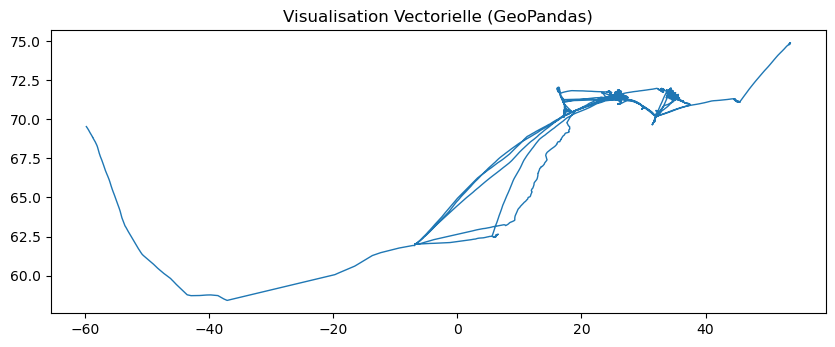

In [ ]:

gdf_tracks = tb.points_to_lines(track_457, group_by='track_id')



import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 6))
gdf_tracks.plot(ax=ax, column='track_id', cmap='tab20', linewidth=1)
plt.title("Visualisation Vectorielle (GeoPandas)")
plt.show()